In [1]:
import os
import sys
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np
import geopandas as gpd
import seaborn as sns
from sklearn.cluster import DBSCAN, OPTICS
from HierarchicalGeoClustering import TreeClusters, Clustering 
from sklearn.preprocessing import StandardScaler
from scipy.spatial import cKDTree, Delaunay
import kneed
import shapely 
from matplotlib import cm
import pandas as pd
import warnings
import contextily as ctx
warnings.filterwarnings('ignore')

/home/miguel/anaconda3/envs/article_HGC/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
df_afternoon = gpd.read_file('../data/Afternoon/wd_d_11.shp')
df_evening = gpd.read_file('../data/Evening/wd_d_11.shp')

In [3]:
df_evening.head()

,id,uname,contenido,fecha,hora,geometry
0,6158590,Monique_Can,No debo hablarle ð¢ð£,2015-01-20,07:17:49,POINT (-99.22080 20.22977)
1,6159223,hectorlgg,@7_Dizal http://t.co/fAyCMJe5S7,2015-01-20,07:36:36,POINT (-99.19952 19.39632)
2,6161972,GabyGoldsmith,Me estoy tratando de conectar,2015-01-20,08:50:26,POINT (-99.23697 19.42043)
3,6162569,Samy_James,Quiero un esquite ð½,2015-01-20,09:05:34,POINT (-99.24591 19.41519)
4,6163536,luna150701,@orrego_flor http://t.co/UQbILIM1OR,2015-01-20,09:28:33,POINT (-99.03399 19.40840)


In [4]:
df_afternoon.head()

,id,uname,contenido,fecha,hora,geometry
0,6151577,CorbataCorbata,http://t.co/K8jPqPoteU,2015-01-20,03:04:42,POINT (-99.16654 19.43711)
1,6152073,dealucas777,http://t.co/tLJnjDU5OJ,2015-01-20,03:22:20,POINT (-99.14428 19.39481)
2,6149938,oscarra84365395,@ANGIECARIME1 que rica estas bb,2015-01-20,02:02:09,POINT (-99.10801 19.38911)
3,6149888,Otro_Dali,Tuiteando con el dentista,2015-01-20,02:00:02,POINT (-99.64388 19.27807)
4,6149890,trendinaliaMX,6. Manuel Velasco\n7. Gobernador de Chiapas\n8...,2015-01-20,02:00:06,POINT (-99.13290 19.43190)


Vamos hacer toda la transformacion en una función para que no lo tenga que estar repitiendo y solo aplicar la función


In [5]:
def node_translate(node, x_off, y_off, a=1, b=0, d=0,e=1):
    """
    Translate the node and ite point and there children
    """
    point_trans_x= x_off
    point_trans_y= y_off
    matrix_trans = [a, b ,d, e, point_trans_x, point_trans_y]
    new_points= [shapely.affinity.affine_transform(i,matrix_trans) for i in node.point_cluster_noise  ]
    node.point_cluster_noise = new_points           
    
    node.polygon_cluster = shapely.affinity.affine_transform(node.polygon_cluster,
                                                    matrix_trans
                                                    )
    # node.center = shapely.affinity.affine_transform(node.center,
    #                                          matrix_trans
    #                                         )
    for i in node.children:
        node_translate(i, x_off, y_off, a=a, b= b, d=d,e=e)
    
    return

In [6]:
def tree_translate_affine(tree_original, x_off, y_off, a=1, b=0, d=0,e=1):
    """
    Translate the tree 
    """
    node_translate(tree_original.root,  x_off, y_off, a=a, b=b, d=d,e=e)
    return

In [7]:
def un_normalize(tree_un,x_min, y_min, x_max, y_max ):
    """
    
    """
    ##### Si la normalización se hizo salvaje entonces 
    b=0
    d=0
    ####3
    a = (x_max - x_min)
    x_off = x_min
    e = (y_max - y_min)
    y_off = y_min
    tree_translate_affine(tree_un,x_off , y_off, a=a, b=b, d=d, e=e)    
    


In [8]:
def get_geopandas_tree_polygon(tree_geo):
    """
    Create a geopandas with the polygons from the tree
    """
    list_dic=[]
    for i , level_nodes in enumerate(tree_geo.levels_nodes):
        # levels_nodes= tree_geo.get_level(i)
        # print(level_nodes)
        for node in level_nodes:
            
            if node.parent == None:
                parent = ''
            else:
                parent = node.parent.name
            # print(node.name)
            list_dic.append({'Polygon': node.polygon_cluster,
                             'name': node.name,
                             'level': i,
                             'parent': parent})
    geopan_return = gpd.GeoDataFrame(list_dic)
    geopan_return.set_geometry('Polygon', inplace=True)
    geopan_return.set_crs(4326, inplace =True, allow_override=True)
    return geopan_return

In [9]:
def get_map_geopandas_tree( ax, geo_tree_polygons, level ):
    """
    
    """
    
    max_ar_p = geo_tree_polygons[ geo_tree_polygons.level == level-1 ]['Polygon'].apply(lambda l: l.area).idxmax()
    geo_tree_polygons[(geo_tree_polygons.level == level) & (geo_tree_polygons.parent== geo_tree_polygons.iloc[max_ar_p]['name'])].plot(ax = ax, alpha=0.4, color='#AD0C78' )

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs = geo_tree_polygons.crs)
    return ax


In [10]:
df_afternoon['x'] = df_afternoon['geometry'].apply(lambda l: l.x )
df_afternoon['y'] = df_afternoon['geometry'].apply(lambda l: l.y )
afternoon_min_x = df_afternoon['x'].min()
afternoon_min_y = df_afternoon['y'].min()
afternoon_max_x = df_afternoon['x'].max()
afternoon_max_y = df_afternoon['y'].max()
df_afternoon = df_afternoon.drop_duplicates(subset = ['x', 'y'])
df_afternoon['x_trans'] = (df_afternoon['x']- afternoon_min_x)/(afternoon_max_x- afternoon_min_x)
df_afternoon['y_trans'] = (df_afternoon['y']- afternoon_min_y)/(afternoon_max_y- afternoon_min_y)
data_arr_afternoon = df_afternoon[['x_trans', 'y_trans']].to_numpy()
dic_points_afternoon = {'points':[data_arr_afternoon], 'parent':''}

In [11]:
df_evening['x'] = df_evening['geometry'].apply(lambda l: l.x )
df_evening['y'] = df_evening['geometry'].apply(lambda l: l.y )
evening_min_x = df_evening['x'].min()
evening_max_x = df_evening['x'].max()
evening_min_y = df_evening['y'].min()
evening_max_y = df_evening['y'].max()
df_evening = df_evening.drop_duplicates(subset = ['x', 'y'])
df_evening['x_trans'] = (df_evening['x']- evening_min_x)/(evening_max_x- evening_min_x)
df_evening['y_trans'] = (df_evening['y']- evening_min_y)/(evening_max_y- evening_min_y)
data_arr_evening = df_evening[['x_trans', 'y_trans']].to_numpy()
dic_points_evening = {'points':[data_arr_evening], 'parent':''}

## Obtain trees


### Afternoon

In [12]:
tree_Natural_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                algorithm = 'natural_cities',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 4,
                                                # verbose = True
                                                )

In [13]:
tree_adaptative_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                algorithm = 'adaptative_DBSCAN',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 9,
                                                min_k = 20,
                                                step_k= 20,
                                                # verbose = True
                                                )

The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters


In [14]:
tree_DBSCAN_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                                  algorithm = 'dbscan',
                                                                  return_noise = True,
                                                                  levels_clustering= 9,
                                                                  
                                                                 )

### Evening

In [15]:
tree_Natural_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'natural_cities',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 4,
                                                # verbose = True
                                                )

In [16]:
tree_adaptative_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'adaptative_DBSCAN',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 5,
                                                min_k = 20,
                                                step_k= 20,
                                                # verbose = True
                                                )

min_k reset to obtain at least 1 value


In [17]:
tree_DBSCAN_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'dbscan',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 9,
                                                # verbose = True
                                                )

In [18]:
un_normalize(tree_adaptative_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_Natural_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_DBSCAN_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_adaptative_evening, evening_min_x, evening_min_y , evening_max_x , evening_max_y)
un_normalize(tree_Natural_evening,  evening_min_x, evening_min_y , evening_max_x , evening_max_y)
un_normalize(tree_DBSCAN_evening,  evening_min_x, evening_min_y , evening_max_x , evening_max_y)


In [19]:
gpd_adapt_afternoon  = get_geopandas_tree_polygon(tree_adaptative_afternoon)
gpd_Natural_afternoon  = get_geopandas_tree_polygon(tree_Natural_afternoon)
gpd_DBSCAN_afternoon  = get_geopandas_tree_polygon(tree_DBSCAN_afternoon)
gpd_adapt_evening  = get_geopandas_tree_polygon(tree_adaptative_evening)
gpd_Natural_evening  = get_geopandas_tree_polygon(tree_Natural_evening)
gpd_DBSCAN_evening  = get_geopandas_tree_polygon(tree_DBSCAN_evening)

In [20]:
gpd_Natural_afternoon.to_pickle('../output/Natural_C_poly_afternoon.pickle')
gpd_adapt_afternoon.to_pickle('../output/Adaptative_poly_afternoon.pickle')
gpd_DBSCAN_afternoon.to_pickle('../output/DBSCAN_afternoon.pickle')

gpd_Natural_evening.to_pickle('../output/Adaptative_poly_evening.pickle')
gpd_adapt_evening.to_pickle('../output/Adaptative_poly_evening.pickle')
gpd_DBSCAN_evening.to_pickle('../output/DBSCAN_evening.pickle')

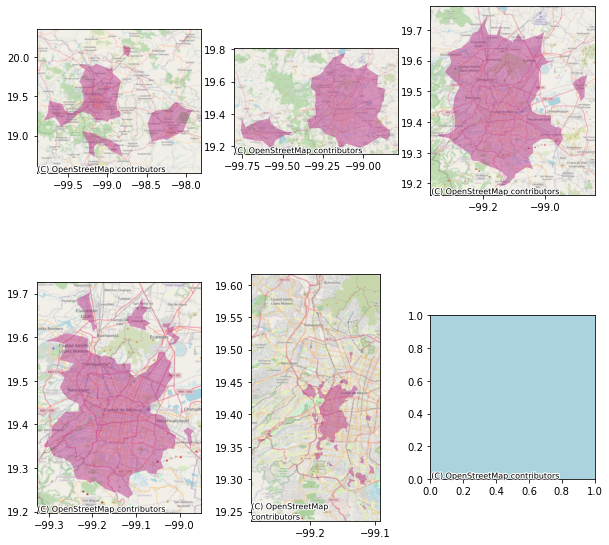

In [21]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,7)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_adapt_evening, level_s)

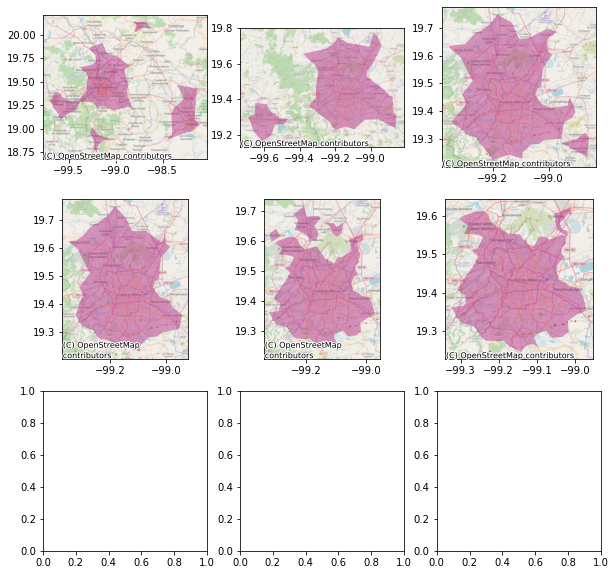

In [22]:
fig, axs = plt.subplots(3,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,7)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_adapt_afternoon, level_s)

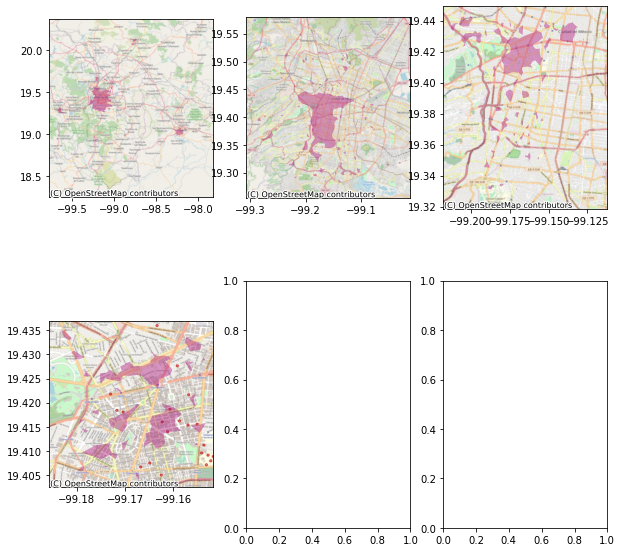

In [23]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,5)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_Natural_afternoon, level_s)

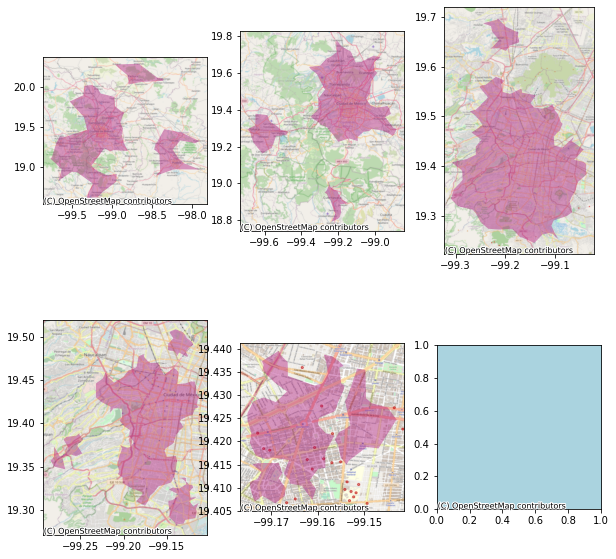

In [45]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,7)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_DBSCAN_afternoon, level_s)

In [25]:
###### NO Borrar 

def recursive_clustering_tree_local(dic_points_ori, **kwargs):
    """
    Obtaing the recursive tree using a specific algorithm
    """
    levels_clustering= kwargs.get('levels_clustering',4)
    algorithm = kwargs.get('algorithm','dbscan')
    verbose = kwargs.get('verbose', False)
    cluster_tree = []
    recursive_clustering_local([dic_points_ori],  # Dictionary with Points
                levels_clustering,  # levels to process
                cluster_tree,  # to store the clusters
                level=0,  # current level
                **kwargs
                )
    
    tree_clus= Clustering.get_tree_from_clustering(cluster_tree)
    tree_from_clus= TreeClusters.TreeClusters()
    tree_from_clus.levels_nodes = tree_clus
    tree_from_clus.root= tree_from_clus.levels_nodes[0][0]
    return tree_from_clus

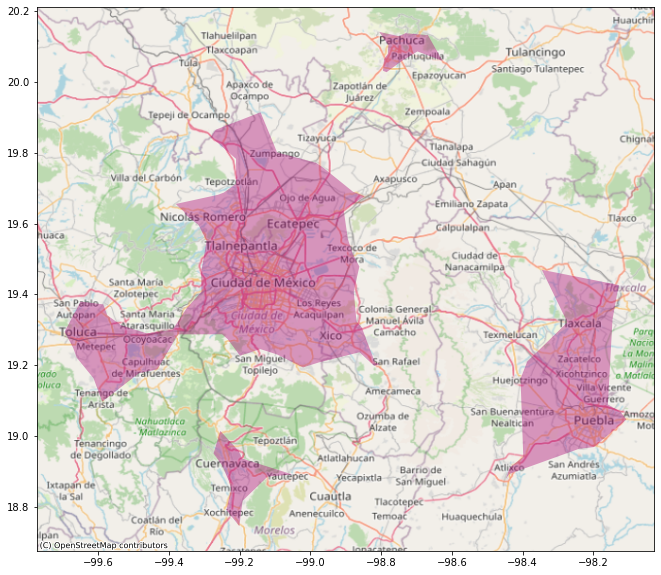

In [26]:
fig, axs = plt.subplots( figsize=(20,10))

get_map_geopandas_tree(axs, gpd_adapt_afternoon, 1)
fig.savefig('../output/real_map0.png', dpi=600)

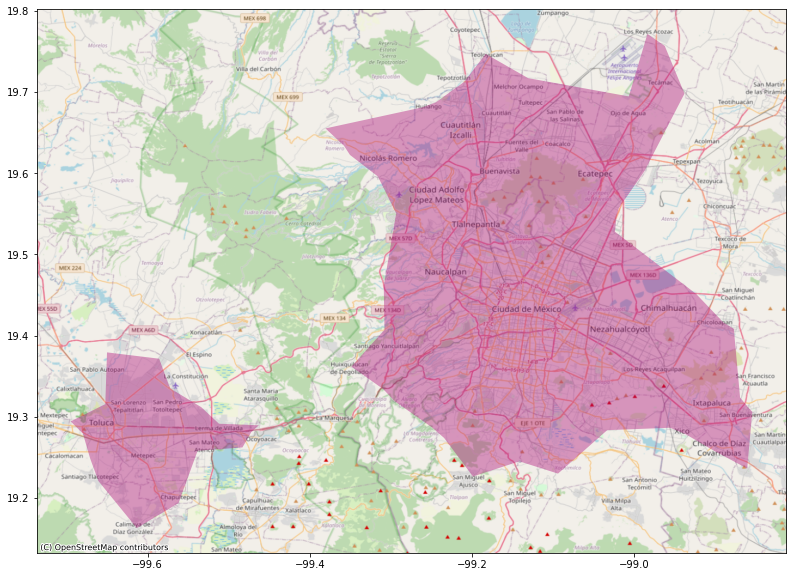

In [27]:
fig, axs = plt.subplots( figsize=(20,10))

get_map_geopandas_tree(axs, gpd_adapt_afternoon, 2)
fig.savefig('../output/real_map1.png', dpi=600)

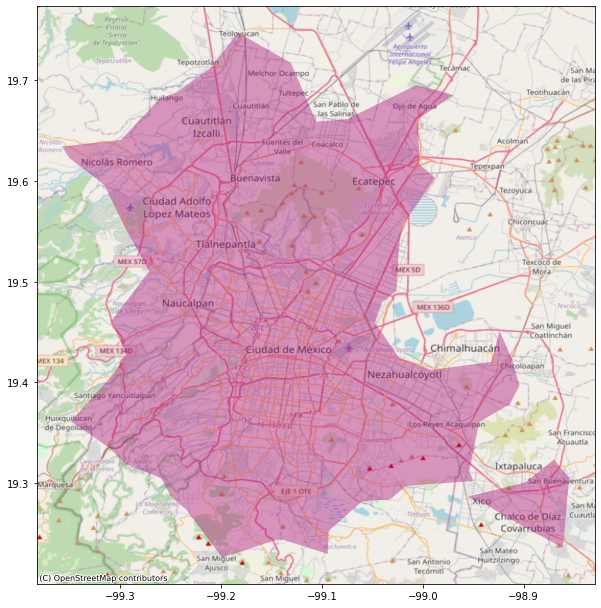

In [28]:
fig, axs = plt.subplots( figsize=(10,20))

get_map_geopandas_tree(axs, gpd_adapt_afternoon, 3)
fig.savefig('../output/real_map2.png', dpi=600)

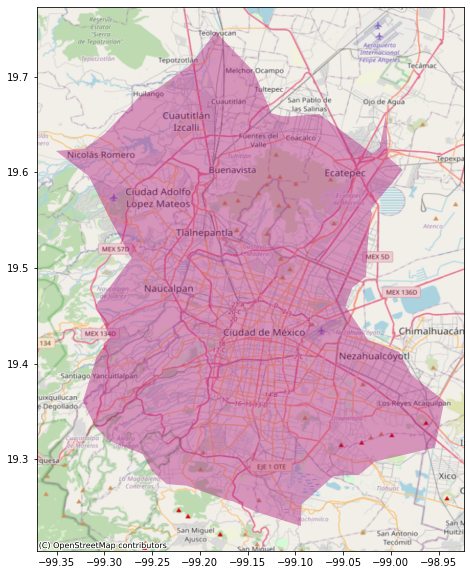

In [29]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 4)
fig.savefig('../output/real_map3.png', dpi=600)

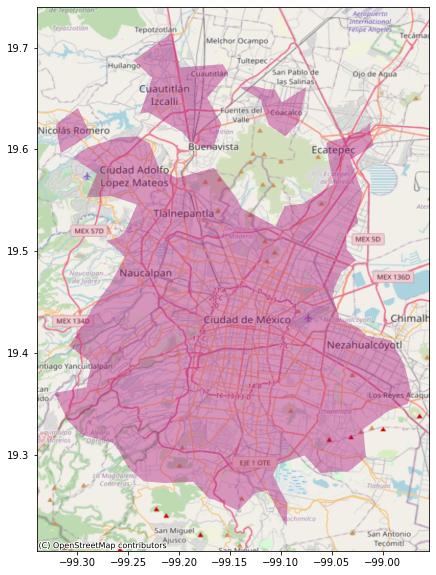

In [30]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 5)
fig.savefig('../output/real_map4.png', dpi=600)

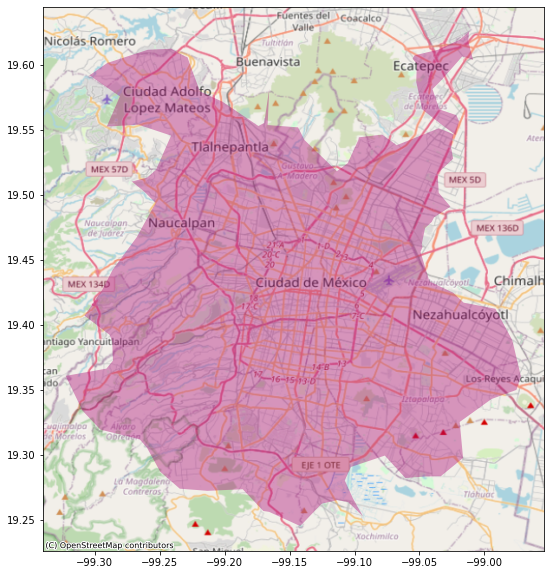

In [31]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 6)
fig.savefig('../output/real_map5.png', dpi=600)

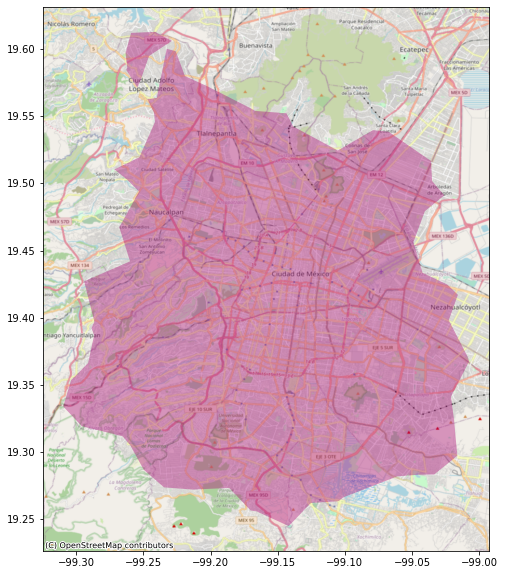

In [32]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 7)
fig.savefig('../output/real_map6.png', dpi=600)

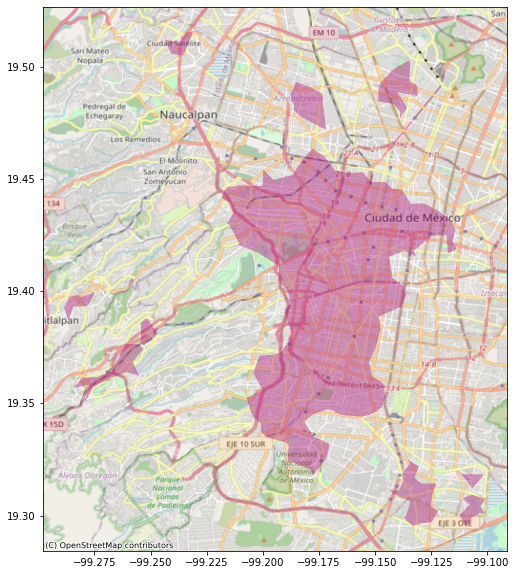

In [33]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 8)
fig.savefig('../output/real_map7.png', dpi=600)

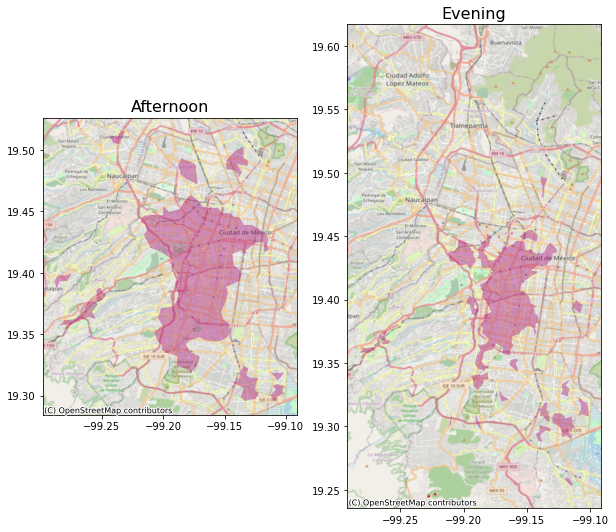

In [34]:
fig, axs = plt.subplots(1,2, figsize=(10,10))
axs = axs.ravel()

get_map_geopandas_tree(axs[0], gpd_adapt_afternoon, 8)
axs[0].title.set_size(16)
axs[0].title.set_text('Afternoon')


get_map_geopandas_tree(axs[1], gpd_adapt_evening, 5)
axs[1].title.set_size(16)
axs[1].title.set_text('Evening')

### Secuencia Natural

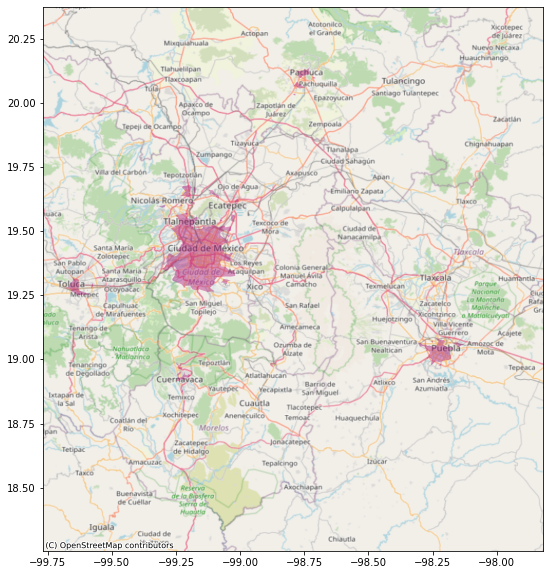

In [35]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_Natural_afternoon, 1)
fig.savefig('../output/secuencia_Natural_1.png', dpi=600)

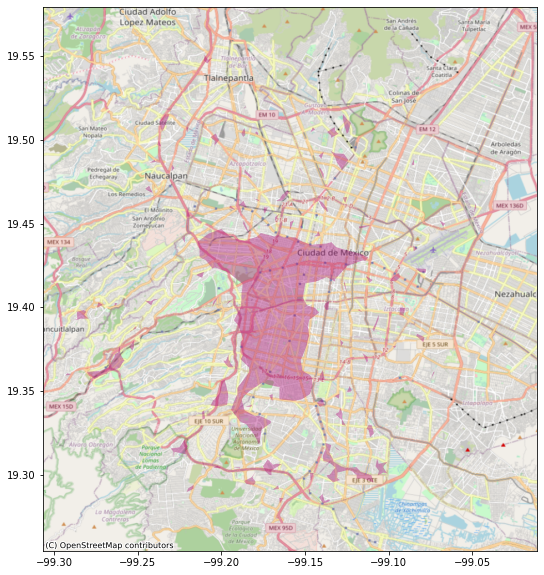

In [36]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2)
fig.savefig('../output/secuencia_Natural_2.png', dpi=600)

### Secuencia DBSCAN

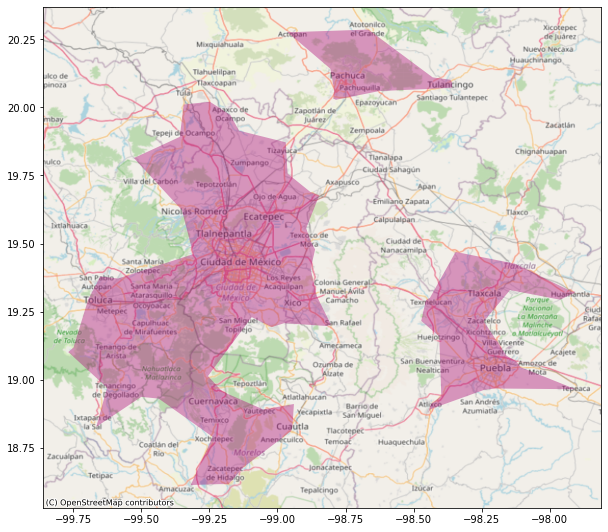

In [37]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 1)
fig.savefig('../output/sec_DBSCAN_afternoon_1.png', dpi=600)

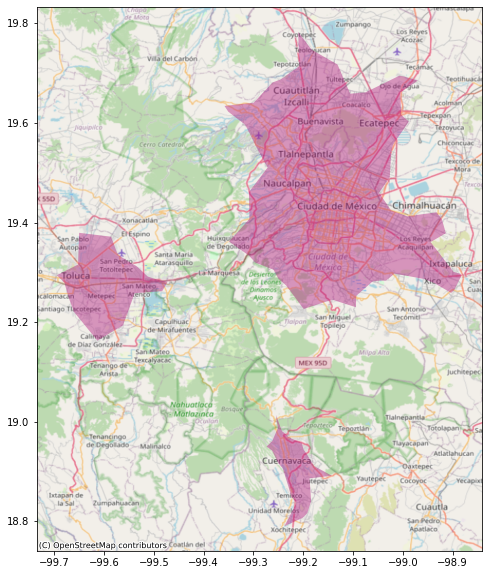

In [38]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 2)
fig.savefig('../output/sec_DBSCAN_afternoon_2.png', dpi=600)

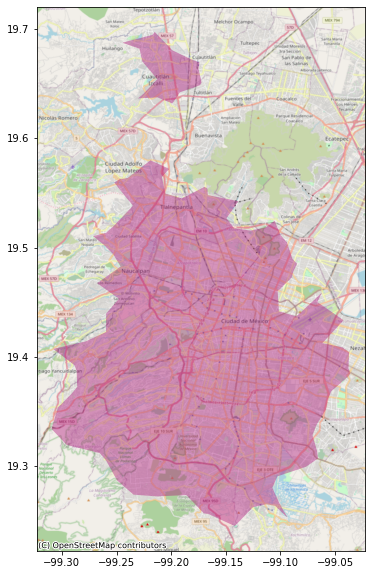

In [39]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 3)
fig.savefig('../output/sec_DBSCAN_afternoon_3.png', dpi=600)

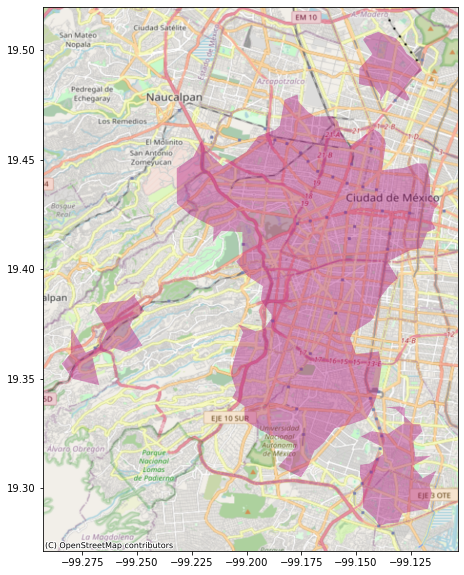

In [40]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 4)
fig.savefig('../output/sec_DBSCAN_afternoon_4.png', dpi=600)

<AxesSubplot:>

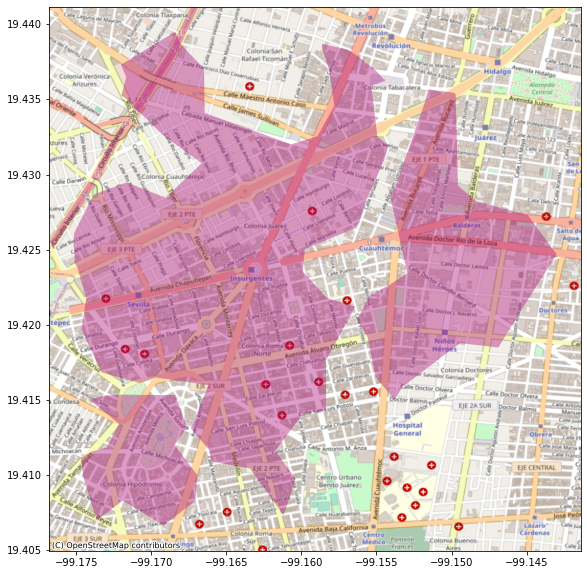

In [ ]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 5)

### Evening Afternoon Matriz

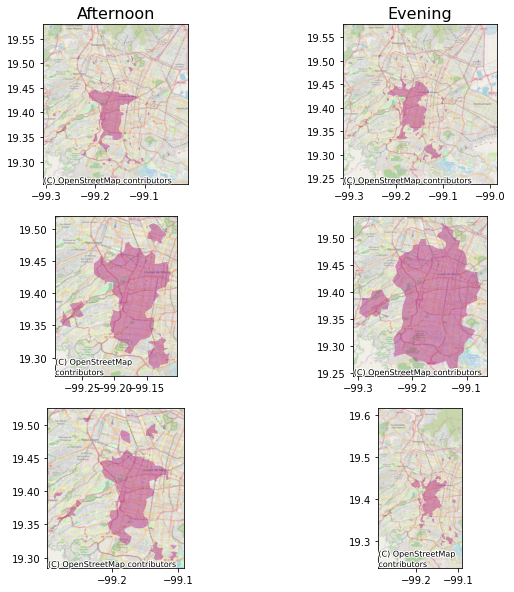

In [41]:
fig, axs = plt.subplots(3,2, figsize=(10,10))
axs = axs.ravel()
#### Natural 
get_map_geopandas_tree(axs[0], gpd_Natural_afternoon, 2)
get_map_geopandas_tree(axs[1], gpd_Natural_evening, 2)
###DBSCAN
get_map_geopandas_tree(axs[2], gpd_DBSCAN_afternoon, 4)
get_map_geopandas_tree(axs[3], gpd_DBSCAN_evening, 4)

## Adaptative
get_map_geopandas_tree(axs[4], gpd_adapt_afternoon, 8)
get_map_geopandas_tree(axs[5], gpd_adapt_evening, 5)


axs[0].title.set_size(16)
axs[0].title.set_text('Afternoon')
axs[1].title.set_size(16)
axs[1].title.set_text('Evening')





-99.2979202 -99.0913358


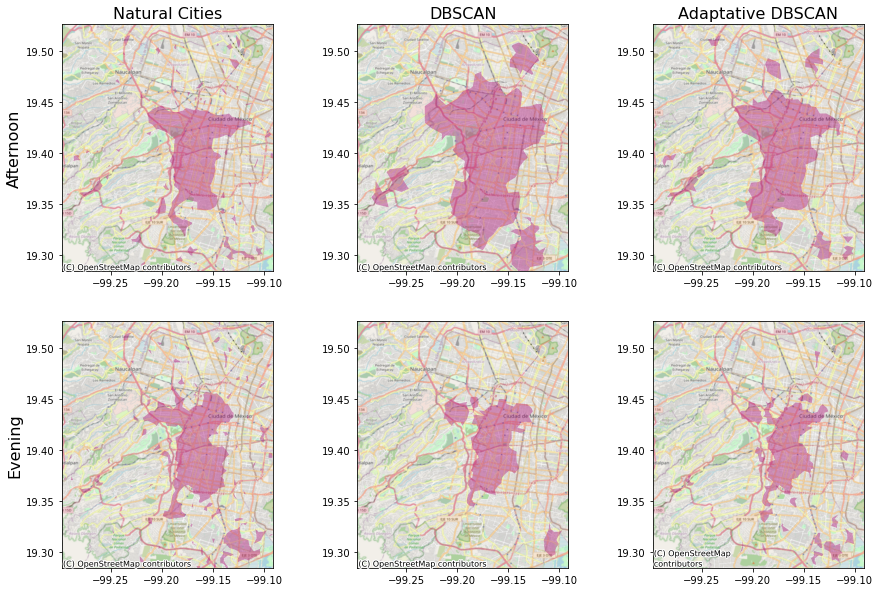

In [57]:
fig, axs = plt.subplots(2,3, figsize=(15,10))
axs = axs.ravel()
#### Natural 
get_map_geopandas_tree(axs[0], gpd_Natural_afternoon, 2)
get_map_geopandas_tree(axs[3], gpd_Natural_evening, 2)
###DBSCAN
get_map_geopandas_tree(axs[1], gpd_DBSCAN_afternoon, 4)
get_map_geopandas_tree(axs[4], gpd_DBSCAN_evening, 5)

## Adaptative
get_map_geopandas_tree(axs[2], gpd_adapt_afternoon, 8)

get_map_geopandas_tree(axs[5], gpd_adapt_evening, 5)

xmin,xmax = axs[2].get_xlim()
ymin,ymax = axs[2].get_ylim()

print(xmin,xmax)
axs[0].set_ylim( ymin,ymax)
axs[0].set_xlim( xmin,xmax)
axs[1].set_ylim( ymin,ymax)
axs[1].set_xlim( xmin,xmax)
axs[4].set_ylim( ymin,ymax)
axs[4].set_xlim( xmin,xmax)
axs[3].set_ylim( ymin,ymax)
axs[3].set_xlim( xmin,xmax)
axs[5].set_ylim( ymin,ymax)
axs[5].set_xlim( xmin,xmax)

###### if is larger
ctx.add_basemap(axs[4], source=ctx.providers.OpenStreetMap.Mapnik, crs = gpd_DBSCAN_evening.crs)


axs[0].title.set_size(16)
axs[0].title.set_text('Natural Cities')
axs[1].title.set_size(16)
axs[1].title.set_text('DBSCAN')
axs[2].title.set_size(16)
axs[2].title.set_text('Adaptative DBSCAN')

axs[0].set_ylabel("Afternoon", fontsize=16)
axs[3].set_ylabel("Evening", fontsize=16)
fig.savefig('../output/Evening_afternoon.pdf', dpi=600)

In [43]:
gpd_DBSCAN_evening['level']

0     0
1     1
2     1
3     2
4     2
5     2
6     2
7     2
8     3
9     3
10    3
11    3
12    3
13    4
14    4
15    5
16    5
17    5
18    5
Name: level, dtype: int64